# 물체 탐지(Object detection)

# 실습 준비

## Google Driver와 Colab 연동

In [0]:
from google.colab import drive
drive.mount('/content/gdrive', force_remount = True)

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/gdrive


## 실행위치 이동

In [0]:
# 현재 위치
!pwd

# 실행 위치 이동
%cd "/content/gdrive/My Drive/04_영상인식_copied/CH678"

# 이동된 위치 확인
!pwd
!ls -al


/content/gdrive/My Drive/04_영상인식_copied/CH678/keras-yolo3/model_data
/content/gdrive/My Drive/04_영상인식_copied/CH678
/content/gdrive/My Drive/04_영상인식_copied/CH678
total 3794
drwx------ 2 root root    4096 Feb  8 09:04 data
drwx------ 2 root root    4096 Feb  8 09:04 .ipynb_checkpoints
drwx------ 8 root root    4096 Feb  8 09:04 keras-yolo3
-rw------- 1 root root 3872429 Feb 11 00:32 Keras_Yolov3_190211_v3.ipynb


# Yolov3을 이용한 물체 탐색

## 1. Yolov3 소스코드 다운로드


*   원본 주소 : https://github.com/qqwweee/keras-yolo3.git

In [0]:
!pwd
!ls -al

/content/gdrive/My Drive/04_영상인식_copied/CH678
total 7087
drwx------ 2 root root    4096 Feb  8 09:04 data
drwx------ 2 root root    4096 Feb  8 09:04 .ipynb_checkpoints
drwx------ 8 root root    4096 Feb  8 09:04 keras-yolo3
-rw------- 1 root root 7244785 Feb 11 00:21 Keras_Yolov3_190211_v3.ipynb


## 2. Convert Keras Model - Yolov3

- convert.py로 Yolo 모델을 Keras 모델로 변환(모델정보 출력)
- coco dataset으로 Pretrain한 모델

 - yolov3.cfg : Darknet yolov3 모델의 Layer

 - yolov3.weight : Darknet yolov3 모델의 weight
 
 - yolo.h5 : Darknet yolov3 모델을 keras 모델로 변환한 대용량 파일

In [0]:
# 실행 위치 이동
%cd keras-yolo3

# 이동된 위치 확인
!pwd
!ls -al

/content/gdrive/My Drive/04_영상인식_copied/CH678/keras-yolo3
/content/gdrive/My Drive/04_영상인식_copied/CH678/keras-yolo3
total 242959
-rw------- 1 root root      1323 Feb  8 09:04 coco_annotation.py
-rw------- 1 root root     10093 Feb  8 09:04 convert.py
-rw------- 1 root root      8316 Feb  8 09:28 edit_train.py
drwx------ 2 root root      4096 Feb  8 09:04 font
drwx------ 2 root root      4096 Feb  8 09:04 .git
-rw------- 1 root root      1201 Feb  8 09:04 .gitignore
drwx------ 2 root root      4096 Feb  8 09:04 .ipynb_checkpoints
-rw------- 1 root root    460800 Feb  8 09:04 keras-yolo3
-rw------- 1 root root      3482 Feb  8 09:04 kmeans.py
-rw------- 1 root root      1064 Feb  8 09:04 LICENSE
drwx------ 2 root root      4096 Feb  8 09:32 logs
drwx------ 2 root root      4096 Feb 11 00:29 model_data
-rw------- 1 root root      4077 Feb  8 09:04 README.md
-rw------- 1 root root     10686 Feb  8 09:04 train_bottleneck.py
-rw------- 1 root root      8332 Feb  8 09:04 train

In [0]:
# 실행하기전 model_data 폴더하위에 기존것이 있다면 삭제
!rm -rf model_data/yolo.h5

# 실행 
%run convert.py yolov3.cfg yolov3.weights model_data/yolo.h5

Loading weights.
Weights Header:  0 2 0 [32013312]
Parsing Darknet config.
Creating Keras model.
Parsing section net_0
Parsing section convolutional_0
conv2d bn leaky (3, 3, 3, 32)
Parsing section convolutional_1
conv2d bn leaky (3, 3, 32, 64)
Parsing section convolutional_2
conv2d bn leaky (1, 1, 64, 32)
Parsing section convolutional_3
conv2d bn leaky (3, 3, 32, 64)
Parsing section shortcut_0
Parsing section convolutional_4
conv2d bn leaky (3, 3, 64, 128)
Parsing section convolutional_5
conv2d bn leaky (1, 1, 128, 64)
Parsing section convolutional_6
conv2d bn leaky (3, 3, 64, 128)
Parsing section shortcut_1
Parsing section convolutional_7
conv2d bn leaky (1, 1, 128, 64)
Parsing section convolutional_8
conv2d bn leaky (3, 3, 64, 128)
Parsing section shortcut_2
Parsing section convolutional_9
conv2d bn leaky (3, 3, 128, 256)
Parsing section convolutional_10
conv2d bn leaky (1, 1, 256, 128)
Parsing section convolutional_11
conv2d bn leaky (3, 3, 128, 256)
Parsing section shortcut_3
Parsi

### 모델구조 이미지화

In [0]:
# 모델 저장한 폴더로 이동
%cd model_data

# 모델 구조 이미지 저장 및 불러오기
from keras.models import load_model
from keras.utils.vis_utils import plot_model as plot
from IPython.display import Image, display

model = load_model('yolo.h5')

plot(model, show_shapes=True, to_file='Yolov3.png')
display(Image(filename='Yolov3.png')) 

/content/gdrive/My Drive/04_영상인식_copied/CH678/keras-yolo3/model_data


/usr/local/lib/python3.6/dist-packages/keras/engine/saving.py:292: UserWarning: No training configuration found in save file: the model was *not* compiled. Compile it manually.
  warnings.warn('No training configuration found in save file: '


## 3. Download example data
 - Object Detection할 예제 데이터 다운로드
 - 원본주소 : http://health.chosun.com/site/data/img_dir/2018/01/17/2018011700908_0.jpg
 - ex_img.jpg 파일로 저장되어 있음

In [0]:
# 예제 파일이 있는 폴더로 이동
%cd  /content/gdrive/My Drive/04_영상인식_copied/CH678/data

# 파일 확인
%ls -la

/content/gdrive/My Drive/04_영상인식_copied/CH678/data
total 889891
-rw------- 1 root root    194949 Feb  8 09:04 ex_img.jpg
-rw------- 1 root root 451020800 Feb  8 09:04 VOCtest_06-Nov-2007.tar
-rw------- 1 root root 460032000 Feb  8 09:04 VOCtrainval_06-Nov-2007.tar


## 4. Install library
- 속성(attributes)으로 명령어 값을 작동하게 하는 라이브러리 설치

In [0]:
!pip install easydict

## 5. Object Detection 예제
- Output 셸에 다운로드한 이미지 파일을 입력
 - yolo.h5 : coco dataset으로 Pretrain한 모델
 - anchors : yolov3의 9개의 anchors Box (Pretrained)
 - classes : coco dataset의 80개의 classes

- 샘플 이미지 파일의 경로 입력 /content/gdrive/My Drive/04_영상인식_copied/CH678/data/ex_img.jpg
- end 입력시 종료

/content/gdrive/My Drive/04_영상인식_copied/CH678/keras-yolo3
Image detection mode
model_data/yolo.h5 model, anchors, and classes loaded.
Input image filename:/content/gdrive/My Drive/04_영상인식_copied/CH678/data/ex_img.jpg
(416, 416, 3)
Found 12 boxes for img
dog 0.36 (309, 209) (402, 285)
dog 0.57 (279, 151) (347, 268)
dog 0.88 (2, 133) (68, 284)
dog 0.90 (505, 62) (593, 290)
dog 0.95 (400, 194) (507, 287)
dog 0.96 (146, 133) (243, 286)
dog 0.96 (406, 70) (511, 289)
dog 0.97 (329, 100) (423, 226)
dog 0.99 (45, 95) (190, 276)
cat 0.41 (309, 209) (402, 285)
cat 0.48 (504, 40) (592, 298)
cat 0.55 (279, 151) (347, 268)
8.91332195799987


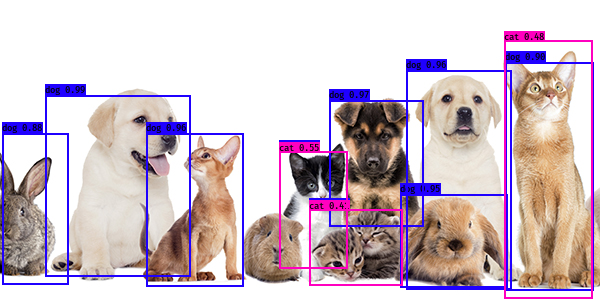

Input image filename:end


In [0]:
%cd "/content/gdrive/My Drive/04_영상인식_copied/CH678/keras-yolo3"
import sys
import argparse
import easydict

# 이미지 보여주기 위한 라이브러리
from IPython.display import display 

# yolo와 PIL 모듈 저장된 경로 sys 경로에 추가
sys.path.append('/content/CH678/keras-yolo3')

from yolo import YOLO, detect_video
from PIL import Image

# 이미지의 물체 탐색을 위한 함수
def detect_img(yolo):
    while True:
        img = input('Input image filename:')
        
        if img =='end':
            break
            
        else:
            try:
                image = Image.open(img)
            except:
                print('Open Error! Try again!')
                continue
            else:
                r_image = yolo.detect_image(image)
                #r_image.show()
                display(r_image)
    
       # yolo.close_session()

FLAGS = None

# 속성 형식으로 명령어 전달 : 모델 위치, anchors 위치, class 위치등 
args=easydict.EasyDict( {
            'model':    YOLO.get_defaults("model_path")
           ,'anchors': YOLO.get_defaults("anchors_path")
           ,'classes': YOLO.get_defaults("classes_path")
#           ,'gpu_num': str(YOLO.get_defaults("gpu_num"))
           ,'image' : 'a'
        })


# 실행
FLAGS = args
print("Image detection mode")
detect_img(YOLO(**vars(FLAGS)))

# 직접 학습 해보기
- voc dataset 이용
- 학습모델은 yolov3모델의 backbone인 darknet53 모델 사용
  - 파라메터 수 : yolov3(6200만개) --> darknet53(4000만개)
  - coloaboratory의 제한된 리소스안에서 학습하기 위함

## 1. Download Train Dataset
- Pascal Visual Object Classes dataset
 - 객체 클래스 인식을 위한 표준화된 이미지 셋과 주석(Annotation) 제공
 - 2008년 이후로는 Annotation이 제공되지 않으므로 2007년 Dataset을 사용한다.
 - 원본 : https://pjreddie.com/media/files/VOCtrainval_06-Nov-2007.tar
 - 원본 : https://pjreddie.com/media/files/VOCtest_06-Nov-2007.tar
 - 압축을 풀면 VOCdevkit 이라는 dataset 폴더가 생성된다.

In [0]:
# dataset tar파일이 있는 폴더로 이동
%cd /content/gdrive/My Drive/04_영상인식_copied/CH678/data

# 파일 확인
%pwd
%ls -al

/content/gdrive/My Drive/04_영상인식_copied/CH678/data
total 889891
-rw------- 1 root root    194949 Feb  8 09:04 ex_img.jpg
-rw------- 1 root root 451020800 Feb  8 09:04 VOCtest_06-Nov-2007.tar
-rw------- 1 root root 460032000 Feb  8 09:04 VOCtrainval_06-Nov-2007.tar


### 압축해제
- 압축해제시 구글 드라이브와의 싱크가 불안정하여 발생되는 이미지 소실을 방지하기 위하여 tmp 파일 밑으로 압축해제
- 모든 런타임 재설정시 dataset은 사라짐
- dataset 압축해제 오랜시간 걸리지 않으므로 이경로로 푸는걸 추천함

In [0]:
!tar xf VOCtrainval_06-Nov-2007.tar -C /tmp/
!tar xf VOCtest_06-Nov-2007.tar -C /tmp/

In [0]:
# 파일 확인
%cd /tmp/
%pwd
%ls -al

/tmp
total 12
drwxrwxrwt 1 root root 4096 Feb 11 03:28 ./
drwxr-xr-x 1 root root 4096 Feb 11 03:18 ../
srw------- 1 root root    0 Feb 11 03:19 drivefs_ipc.0=
srw------- 1 root root    0 Feb 11 03:19 drivefs_ipc.0_shell=
drwxrwxrwx 3 root root 4096 Nov  6  2007 VOCdevkit/


## 2. darknet53 weight 다운로드
- yolov3모델의 기본 모델로 적은 layer개수와 파라메터로 인하여 colab에서의 학습에 용이
- 확장자명은 .weights로 수정
- 원본주소 :  https://pjreddie.com/media/files/darknet53.conv.74
- cfg 파일은 yolov3 소스데이터안에 들어있음

In [0]:
# 다운로드할 위치로 이동(yolov3.cfg, weights가 있는 폴더)
%cd /content/gdrive/My Drive/04_영상인식_copied/CH678/keras-yolo3

# 위치 및 파일확인
%pwd
%ls -al


/content/gdrive/My Drive/04_영상인식_copied/CH678/keras-yolo3
total 401643
-rw------- 1 root root    222855 Feb 11 02:00 2007_train.txt
-rw------- 1 root root      1323 Feb  8 09:04 coco_annotation.py
-rw------- 1 root root     10093 Feb  8 09:04 convert.py
-rw------- 1 root root      5707 Feb 11 01:22 darknet53.cfg
-rw------- 1 root root 162482580 Feb 11 01:25 darknet53.weights
-rw------- 1 root root      7172 Feb 11 02:25 edit_train.py
drwx------ 2 root root      4096 Feb  8 09:04 font/
drwx------ 2 root root      4096 Feb  8 09:04 .git/
-rw------- 1 root root      1201 Feb  8 09:04 .gitignore
drwx------ 2 root root      4096 Feb  8 09:04 .ipynb_checkpoints/
-rw------- 1 root root    460800 Feb  8 09:04 keras-yolo3
-rw------- 1 root root      3482 Feb  8 09:04 kmeans.py
-rw------- 1 root root      1064 Feb  8 09:04 LICENSE
drwx------ 3 root root      4096 Feb  8 09:32 logs/
drwx------ 2 root root      4096 Feb  8 09:04 model_data/
drwx------ 2 root root      4096 Feb 11 00:56 __p

In [0]:
# 만약 기존 것이 잇따면 삭제
!rm darknet53.weights

# 파일 다운로드
!wget https://pjreddie.com/media/files/darknet53.conv.74 -O "darknet53.weights"

# 파일 확인  
%ls -al

--2019-02-11 01:25:05--  https://pjreddie.com/media/files/darknet53.conv.74
Resolving pjreddie.com (pjreddie.com)... 128.208.3.39
Connecting to pjreddie.com (pjreddie.com)|128.208.3.39|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 162482580 (155M) [application/octet-stream]
Saving to: ‘darknet53.weights’

darknet53.weights   100%[===================>] 154.96M  20.6MB/s    in 8.9s    

2019-02-11 01:25:15 (17.4 MB/s) - ‘darknet53.weights’ saved [162482580/162482580]

total 401644
-rw------- 1 root root      1323 Feb  8 09:04 coco_annotation.py
-rw------- 1 root root     10093 Feb  8 09:04 convert.py
-rw------- 1 root root      5707 Feb 11 01:22 darknet53.cfg
-rw------- 1 root root 162482580 Mar 25  2018 darknet53.weights
-rw------- 1 root root      8316 Feb  8 09:28 edit_train.py
drwx------ 2 root root      4096 Feb  8 09:04 font/
drwx------ 2 root root      4096 Feb  8 09:04 .git/
-rw------- 1 root root      1201 Feb  8 09:04 .gitignore
drwx------ 2 root roo

## 2. Convert Keras Model - darknet53
- Darknet53 모델을 Keras 모델로 변환한다.
 - darknet53.cfg : Darknet53 모델의 Layer
 - darknet53.weights : Darknet53 모델의 Weight
 - darknet53_weights.h5 : Darknet53 모델을 keras 모델로 변환한 대용량 파일

In [0]:
# 실행하기전 model_data 폴더하위에 기존것이 있다면 삭제
!rm -rf model_data/darknet53.h5

# 실행 .
%run convert.py darknet53.cfg darknet53.weights model_data/darknet53.h5

Loading weights.
Weights Header:  0 2 0 [0]
Parsing Darknet config.
Creating Keras model.
Parsing section net_0
Parsing section convolutional_0
conv2d bn leaky (3, 3, 3, 32)
Parsing section convolutional_1
conv2d bn leaky (3, 3, 32, 64)
Parsing section convolutional_2
conv2d bn leaky (1, 1, 64, 32)
Parsing section convolutional_3
conv2d bn leaky (3, 3, 32, 64)
Parsing section shortcut_0
Parsing section convolutional_4
conv2d bn leaky (3, 3, 64, 128)
Parsing section convolutional_5
conv2d bn leaky (1, 1, 128, 64)
Parsing section convolutional_6
conv2d bn leaky (3, 3, 64, 128)
Parsing section shortcut_1
Parsing section convolutional_7
conv2d bn leaky (1, 1, 128, 64)
Parsing section convolutional_8
conv2d bn leaky (3, 3, 64, 128)
Parsing section shortcut_2
Parsing section convolutional_9
conv2d bn leaky (3, 3, 128, 256)
Parsing section convolutional_10
conv2d bn leaky (1, 1, 256, 128)
Parsing section convolutional_11
conv2d bn leaky (3, 3, 128, 256)
Parsing section shortcut_3
Parsing sect

### 모델구조 이미지화

/content/gdrive/My Drive/04_영상인식_copied/CH678/keras-yolo3/model_data


/usr/local/lib/python3.6/dist-packages/keras/engine/saving.py:292: UserWarning: No training configuration found in save file: the model was *not* compiled. Compile it manually.
  warnings.warn('No training configuration found in save file: '


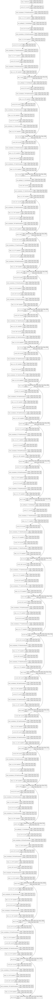

In [0]:
# 모델 저장한 폴더로 이동
%cd model_data

# 모델 구조 이미지 저장 및 불러오기
from keras.models import load_model
from keras.utils.vis_utils import plot_model as plot
from IPython.display import Image, display

model = load_model('darknet53.h5')

plot(model, show_shapes=True, to_file='darknet53.png')
display(Image(filename='darknet53.png')) 

## 3.  학습을 위한 이미지 정보 생성
- voc_annotation.py로 image파일 경로 + Bounding Box 정보 + Class Index 정보가 있는 txt 파일 생성

In [0]:
# txt파일 저장할 위치로 이동
%cd /tmp

# 위치 및 파일 확인
%pwd
%ls -al

/tmp
total 876
drwxrwxrwt 1 root root   4096 Feb 11 01:54 ./
drwxr-xr-x 1 root root   4096 Feb 11 00:10 ../
-rw-r--r-- 1 root root 433052 Feb 11 01:56 2007_test.txt
-rw-r--r-- 1 root root 222855 Feb 11 01:56 2007_train.txt
-rw-r--r-- 1 root root 223295 Feb 11 01:56 2007_val.txt
srw------- 1 root root      0 Feb 11 00:12 drivefs_ipc.0=
srw------- 1 root root      0 Feb 11 00:12 drivefs_ipc.0_shell=
drwxrwxrwx 3 root root   4096 Nov  6  2007 VOCdevkit/


In [0]:
# 기존 파일 삭제
!rm *.txt

# voc_annotation.py 실행
%run '/content/gdrive/My Drive/04_영상인식_copied/CH678/keras-yolo3/voc_annotation.py'

# 파일 확인
%ls -al

total 876
drwxrwxrwt 1 root root   4096 Feb 11 01:56 ./
drwxr-xr-x 1 root root   4096 Feb 11 00:10 ../
-rw-r--r-- 1 root root 433052 Feb 11 01:56 2007_test.txt
-rw-r--r-- 1 root root 222855 Feb 11 01:56 2007_train.txt
-rw-r--r-- 1 root root 223295 Feb 11 01:56 2007_val.txt
srw------- 1 root root      0 Feb 11 00:12 drivefs_ipc.0=
srw------- 1 root root      0 Feb 11 00:12 drivefs_ipc.0_shell=
drwxrwxrwx 3 root root   4096 Nov  6  2007 VOCdevkit/


In [0]:
# 이미지 정보 확인
!head 2007_train.txt

/tmp/VOCdevkit/VOC2007/JPEGImages/000012.jpg 156,97,351,270,6
/tmp/VOCdevkit/VOC2007/JPEGImages/000017.jpg 185,62,279,199,14 90,78,403,336,12
/tmp/VOCdevkit/VOC2007/JPEGImages/000023.jpg 9,230,245,500,1 230,220,334,500,1 2,1,117,369,14 3,2,243,462,14 225,1,334,486,14
/tmp/VOCdevkit/VOC2007/JPEGImages/000026.jpg 90,125,337,212,6
/tmp/VOCdevkit/VOC2007/JPEGImages/000032.jpg 104,78,375,183,0 133,88,197,123,0 195,180,213,229,14 26,189,44,238,14
/tmp/VOCdevkit/VOC2007/JPEGImages/000033.jpg 9,107,499,263,0 421,200,482,226,0 325,188,411,223,0
/tmp/VOCdevkit/VOC2007/JPEGImages/000034.jpg 116,167,360,400,18 141,153,333,229,18
/tmp/VOCdevkit/VOC2007/JPEGImages/000035.jpg 1,96,191,361,14 218,98,465,318,14
/tmp/VOCdevkit/VOC2007/JPEGImages/000036.jpg 27,79,319,344,11
/tmp/VOCdevkit/VOC2007/JPEGImages/000042.jpg 263,32,500,295,18 1,36,235,299,18


In [0]:
# 학습을 위해 2007_train.txt 파일 복사 및 경로 변경
%cp 2007_train.txt  '/content/gdrive/My Drive/04_영상인식_copied/CH678/keras-yolo3/2007_train.txt'

# 이동된 파일 확인
%cd /content/gdrive/My Drive/04_영상인식_copied/CH678/keras-yolo3/
%ls -al

/content/gdrive/My Drive/04_영상인식_copied/CH678/keras-yolo3
total 401862
-rw------- 1 root root    222855 Feb 11 02:00 2007_train.txt
-rw------- 1 root root      1323 Feb  8 09:04 coco_annotation.py
-rw------- 1 root root     10093 Feb  8 09:04 convert.py
-rw------- 1 root root      5707 Feb 11 01:22 darknet53.cfg
-rw------- 1 root root 162482580 Mar 25  2018 darknet53.weights
-rw------- 1 root root      8316 Feb  8 09:28 edit_train.py
drwx------ 2 root root      4096 Feb  8 09:04 font/
drwx------ 2 root root      4096 Feb  8 09:04 .git/
-rw------- 1 root root      1201 Feb  8 09:04 .gitignore
drwx------ 2 root root      4096 Feb  8 09:04 .ipynb_checkpoints/
-rw------- 1 root root    460800 Feb  8 09:04 keras-yolo3
-rw------- 1 root root      3482 Feb  8 09:04 kmeans.py
-rw------- 1 root root      1064 Feb  8 09:04 LICENSE
drwx------ 2 root root      4096 Feb  8 09:32 logs/
drwx------ 2 root root      4096 Feb 11 01:53 model_data/
drwx------ 2 root root      4096 Feb 11 00:56 __p

## 4. 학습을 위한 하이퍼 파라메터 조정
- 원활한 학습을 위해 batch size, epoch, weights_path를 수정 후 edit_train.py로 저장
- colab 성능의 한계로 인한 파라메터 조정
 - class : vocclass(20개)
 - anchors : coco image data set을 통해 만들어진 yolo_anchors 사용
 - batch_size : 32 -> 16
 - epochs : 총 100 -> 10
 - weights : darknet53.h5
 - Epoch 1~5 : 뒷부분의 3개의 Layer를 제외한 나머지 Layer를 Freeze한 상태로 학습 --> trained_weights_stage_1.h5
 - Epoch 6~10 : 모든 Layer를 대상으로 학습 --> trained_weights_final.h5

In [0]:
# 실행 폴더로 이동
%cd /content/gdrive/My Drive/04_영상인식_copied/CH678/keras-yolo3

# 파일 확인
%ls 

/content/gdrive/My Drive/04_영상인식_copied/CH678/keras-yolo3
2007_train.txt      font/        __pycache__/         yolo.py
coco_annotation.py  keras-yolo3  README.md            yolov3.cfg
convert.py          kmeans.py    train_bottleneck.py  yolov3-tiny.cfg
darknet53.cfg       LICENSE      train.py             yolov3.weights
darknet53.weights   logs/        voc_annotation.py    yolo_video.py
edit_train.py       model_data/  yolo3/


In [0]:
%%file edit_train.py
"""
Retrain the YOLO model for your own dataset.
"""

import numpy as np
import keras.backend as K
from keras.layers import Input, Lambda
from keras.models import Model
from keras.optimizers import Adam
from keras.callbacks import TensorBoard, ModelCheckpoint, ReduceLROnPlateau, EarlyStopping

from yolo3.model import preprocess_true_boxes, yolo_body, tiny_yolo_body, yolo_loss
from yolo3.utils import get_random_data


def _main():
    annotation_path = '2007_train.txt'
    log_dir = 'logs/000/'
    classes_path = 'model_data/voc_classes.txt'
    anchors_path = 'model_data/yolo_anchors.txt'
    class_names = get_classes(classes_path)
    num_classes = len(class_names)
    anchors = get_anchors(anchors_path)

    input_shape = (416,416) # 이미지 input 크기

    # 모델 생성 (darknet53)
    model = create_model(input_shape, anchors, num_classes,
                          freeze_body=2, weights_path='model_data/darknet53.h5') 
    model.summary()
    # log파일 저장위치
    logging = TensorBoard(log_dir=log_dir)
    
    #체크 포인트 생성
    checkpoint = ModelCheckpoint(log_dir + 'ep{epoch:03d}-loss{loss:.3f}-val_loss{val_loss:.3f}.h5',
        monitor='val_loss', save_weights_only=True, save_best_only=True, period=3)
    
    # 학습률 감소시켜 학습
    reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=3, verbose=1)
    
    # 학습 조기 종료 
    early_stopping = EarlyStopping(monitor='val_loss', min_delta=0, patience=10, verbose=1)

    #데이터셋 train, val 나누기
    val_split = 0.1
    with open(annotation_path) as f:
        lines = f.readlines()
    np.random.seed(10101)
    np.random.shuffle(lines)
    np.random.seed(None)
    num_val = int(len(lines)*val_split)
    num_train = len(lines) - num_val

    # 처음학습 할 때에는 loss의 안정을 위해 레이어 고정 후 학습
    # 나쁘지 않은 모델을 얻기위한 epoch 및 파라메터 조정
    if True:
        model.compile(optimizer=Adam(lr=1e-3), loss={
            # use custom yolo_loss Lambda layer.
            'yolo_loss': lambda y_true, y_pred: y_pred})

        batch_size = 10
        print('Train on {} samples, val on {} samples, with batch size {}.'.format(num_train, num_val, batch_size))
        model.fit_generator(data_generator_wrapper(lines[:num_train], batch_size, input_shape, anchors, num_classes),
                steps_per_epoch=max(1, num_train//batch_size),
                validation_data=data_generator_wrapper(lines[num_train:], batch_size, input_shape, anchors, num_classes),
                validation_steps=max(1, num_val//batch_size),
                epochs=5,   # 5번까지 앞 레이어 파라미터 고정
                initial_epoch=0,
                callbacks=[logging, checkpoint])
        
        # 처음 5번까지 학습한 weight 저장
        model.save_weights(log_dir + 'trained_weights_stage_1.h5')

        
    # 모든 레이어 학습
    # 결과가 좋지 않다면 학습은 더 오래 걸림
    if True:
        for i in range(len(model.layers)):
            model.layers[i].trainable = True
        model.compile(optimizer=Adam(lr=1e-4), loss={'yolo_loss': lambda y_true, y_pred: y_pred}) # recompile to apply the change
        print('Unfreeze all of the layers.')

        batch_size = 10 # unfreezing 된 모델은 더 많은 GPU memory가 요구된다
        print('Train on {} samples, val on {} samples, with batch size {}.'.format(num_train, num_val, batch_size))
        model.fit_generator(data_generator_wrapper(lines[:num_train], batch_size, input_shape, anchors, num_classes),
            steps_per_epoch=max(1, num_train//batch_size),
            validation_data=data_generator_wrapper(lines[num_train:], batch_size, input_shape, anchors, num_classes),
            validation_steps=max(1, num_val//batch_size),
            epochs=10,  # 6~10번 모든 파라메터 학습
            initial_epoch=5,
            callbacks=[logging, checkpoint, reduce_lr, early_stopping])
        
        # 마지막 학습 weight 저장
        model.save_weights(log_dir + 'trained_weights_final.h5')

    # 더 많은 학습이 필요할 것

# class 정보 가져오기
def get_classes(classes_path):
    '''loads the classes'''
    with open(classes_path) as f:
        class_names = f.readlines()
    class_names = [c.strip() for c in class_names]
    return class_names

# anchors박스 정보 가져오기
def get_anchors(anchors_path):
    '''loads the anchors from a file'''
    with open(anchors_path) as f:
        anchors = f.readline()
    anchors = [float(x) for x in anchors.split(',')]
    return np.array(anchors).reshape(-1, 2)

# 모델 생성 함수
def create_model(input_shape, anchors, num_classes, load_pretrained=True, freeze_body=2,
            weights_path='model_data/yolo.h5'):
    '''create the training model'''
    K.clear_session() # get a new session
    image_input = Input(shape=(None, None, 3))
    h, w = input_shape
    num_anchors = len(anchors)

    y_true = [Input(shape=(h//{0:32, 1:16, 2:8}[l], w//{0:32, 1:16, 2:8}[l], \
        num_anchors//3, num_classes+5)) for l in range(3)]

    model_body = yolo_body(image_input, num_anchors//3, num_classes)
    print('Create YOLOv3 model with {} anchors and {} classes.'.format(num_anchors, num_classes))

    if load_pretrained:
        model_body.load_weights(weights_path, by_name=True, skip_mismatch=True)
        print('Load weights {}.'.format(weights_path))
        if freeze_body in [1, 2]:
            # Freeze darknet53 body or freeze all but 3 output layers.
            num = (185, len(model_body.layers)-3)[freeze_body-1]
            for i in range(num): model_body.layers[i].trainable = False
            print('Freeze the first {} layers of total {} layers.'.format(num, len(model_body.layers)))

    model_loss = Lambda(yolo_loss, output_shape=(1,), name='yolo_loss',
        arguments={'anchors': anchors, 'num_classes': num_classes, 'ignore_thresh': 0.5})(
        [*model_body.output, *y_true])
    model = Model([model_body.input, *y_true], model_loss)

    return model

# data 전처리 
def data_generator(annotation_lines, batch_size, input_shape, anchors, num_classes):
    '''data generator for fit_generator'''
    n = len(annotation_lines)
    i = 0
    while True:
        image_data = []
        box_data = []
        for b in range(batch_size):
            if i==0:
                np.random.shuffle(annotation_lines)
            image, box = get_random_data(annotation_lines[i], input_shape, random=True)
            image_data.append(image)
            box_data.append(box)
            i = (i+1) % n
        image_data = np.array(image_data)
        box_data = np.array(box_data)
        y_true = preprocess_true_boxes(box_data, input_shape, anchors, num_classes)
        yield [image_data, *y_true], np.zeros(batch_size)

# data 전처리
def data_generator_wrapper(annotation_lines, batch_size, input_shape, anchors, num_classes):
    n = len(annotation_lines)
    if n==0 or batch_size<=0: return None
    return data_generator(annotation_lines, batch_size, input_shape, anchors, num_classes)

if __name__ == '__main__':
    _main()
    


Writing edit_train.py


## 5. train
- VOC 2007 data set으로 학습
- 2500개의 이미지 샘플
- 청크 관련 에러시 ( 리소스 부족으로 인한 에러)
 - 1. 런타임 메뉴의 모든 런타짐 재설정 클릭하여 초기화
 - 2. 드라이브 연결 및 링크 실행
 - 3. 다시 edit_train.py 실행


In [0]:
# 런타임 재설정후 드라이브 연결
#from google.colab import drive
#drive.mount('/content/gdrive')

In [0]:
# 학습 실행
%cd /content/gdrive/My Drive/04_영상인식_copied/CH678/keras-yolo3
!python edit_train.py

/content/gdrive/My Drive/04_영상인식_copied/CH678/keras-yolo3
Using TensorFlow backend.
Instructions for updating:
Colocations handled automatically by placer.
2019-02-11 04:44:21.782577: I tensorflow/core/platform/profile_utils/cpu_utils.cc:94] CPU Frequency: 2300000000 Hz
2019-02-11 04:44:21.782816: I tensorflow/compiler/xla/service/service.cc:150] XLA service 0x1d171e0 executing computations on platform Host. Devices:
2019-02-11 04:44:21.782854: I tensorflow/compiler/xla/service/service.cc:158]   StreamExecutor device (0): <undefined>, <undefined>
2019-02-11 04:44:21.870394: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2019-02-11 04:44:21.871083: I tensorflow/compiler/xla/service/service.cc:150] XLA service 0x1d16b00 executing computations on platform CUDA. Devices:
2019-02-11 04:44:21.871124: I tensorflow/compiler/xla/service/service

# 학습한 결과로 Object Detection
- 10번 학습한 trained_weights_final.h5 model과 voc_classes.txt를 적용하여 Predict
  -  anchors : yolov3의 9개의 anchors Box (Pretrained)
  - classes : voc dataset의 20개의 classes
- 이미지 파일은 VOC2007 Test dataset 사용
- data 폴더 밑 2007_test.txt 정보
- ex)
 *   /tmp/VOCdevkit/VOC2007/JPEGImages/000049.jpg
 *   /tmp/VOCdevkit/VOC2007/JPEGImages/001552.jpg
 *   /tmp/VOCdevkit/VOC2007/JPEGImages/006054.jpg
 *   /tmp/VOCdevkit/VOC2007/JPEGImages/007404.jpg
 *   /tmp/VOCdevkit/VOC2007/JPEGImages/009067.jpg



/content/gdrive/My Drive/04_영상인식_copied/CH678/keras-yolo3
Image detection mode
/content/gdrive/My Drive/04_영상인식_copied/CH678/keras-yolo3/logs/000/trained_weights_final.h5 model, anchors, and classes loaded.
Input image filename:/tmp/VOCdevkit/VOC2007/JPEGImages/000049.jpg
(416, 416, 3)
Found 0 boxes for img
3.828958666001199


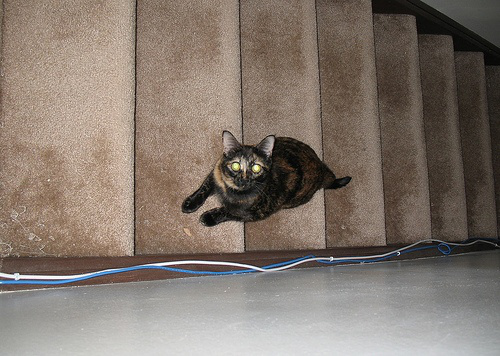

Input image filename:/tmp/VOCdevkit/VOC2007/JPEGImages/001552.jpg
(416, 416, 3)
Found 0 boxes for img
0.15413451799940958


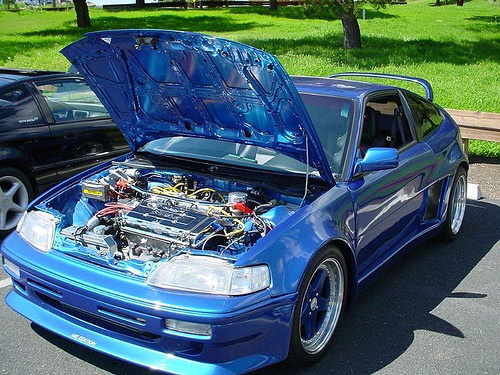

Input image filename:/tmp/VOCdevkit/VOC2007/JPEGImages/006054.jpg
(416, 416, 3)
Found 0 boxes for img
0.14138853099939297


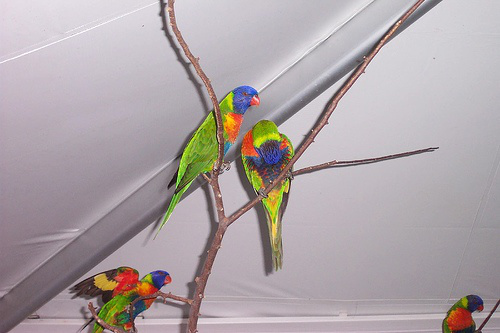

Input image filename:/tmp/VOCdevkit/VOC2007/JPEGImages/007404.jpg
(416, 416, 3)
Found 0 boxes for img
0.15810496099948068


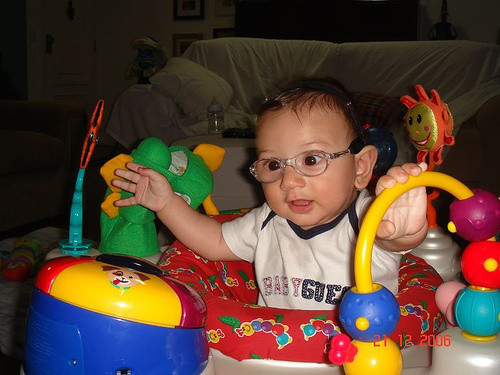

Input image filename:/tmp/VOCdevkit/VOC2007/JPEGImages/009067.jpg
(416, 416, 3)
Found 0 boxes for img
0.16412099500121258


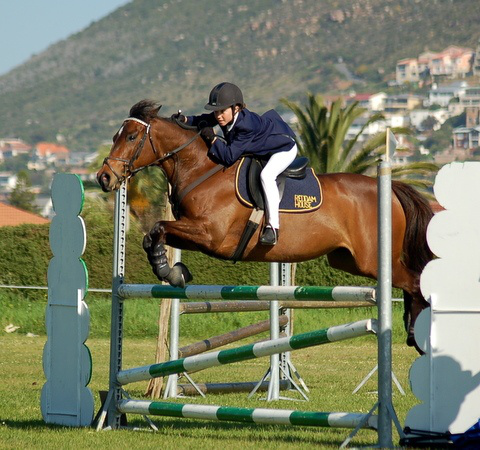

Input image filename:end


In [0]:
%cd "/content/gdrive/My Drive/04_영상인식_copied/CH678/keras-yolo3"
import sys
import argparse
import easydict

# 이미지 보여주기 위한 라이브러리
from IPython.display import display 

# yolo와 PIL 모듈 저장된 경로 sys 경로에 추가
sys.path.append('/content/CH678/keras-yolo3')

from yolo import YOLO, detect_video
from PIL import Image

# 이미지의 물체 탐색을 위한 함수
def detect_img(yolo):
    while True:
        img = input('Input image filename:')
        
        if img =='end':
            break
            
        else:
            try:
                image = Image.open(img)
            except:
                print('Open Error! Try again!')
                continue
            else:
                r_image = yolo.detect_image(image)
                #r_image.show()
                display(r_image)
    
       # yolo.close_session()

FLAGS = None

# 속성 형식으로 명령어 전달 : 모델 위치, anchors 위치, class 위치등 
args=easydict.EasyDict( {
            'model_path': '/content/gdrive/My Drive/04_영상인식_copied/CH678/keras-yolo3/logs/000/trained_weights_final.h5'
#            'model':    YOLO.get_defaults("model_path")
           ,'anchors': YOLO.get_defaults("anchors_path")
           ,'classes_path': '/content/gdrive/My Drive/04_영상인식_copied/CH678/keras-yolo3/model_data/voc_classes.txt'
#           ,'classes': YOLO.get_defaults("classes_path")
#           ,'gpu_num': str(YOLO.get_defaults("gpu_num"))
           ,'image' : 'a'
        })

FLAGS = args
print("Image detection mode")
detect_img(YOLO(**vars(FLAGS)))

# yolov3 모델 이용 학습한 결과로 detection
- yolov3 모델을 사용하여 위와같이 10번 학습한후 freeze한 layer 없이 36번더 학습한 결과
- content/gdrive/My Drive/04_영상인식_copied/CH678/keras-yolo3/model_data/trained_36_unfreeze.h5로 저장되어 있음
- 딥러닝 학습을 위한 서버에서 별도로 학습(학습장비 : GPU - TITAN Xp)
- 50번 학습예정이었으나 loss의 변동이 별로 없어 학습 종료


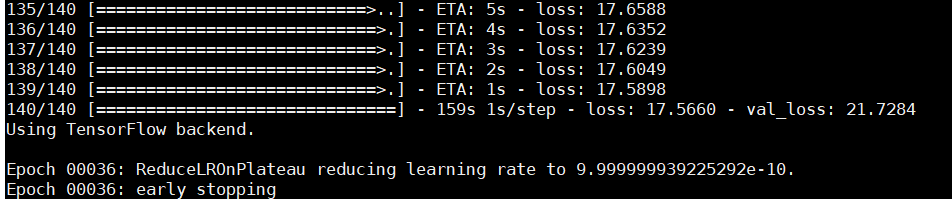

 *   /tmp/VOCdevkit/VOC2007/JPEGImages/000049.jpg
 *   /tmp/VOCdevkit/VOC2007/JPEGImages/001552.jpg
 *   /tmp/VOCdevkit/VOC2007/JPEGImages/006054.jpg
 *   /tmp/VOCdevkit/VOC2007/JPEGImages/007404.jpg
 *   /tmp/VOCdevkit/VOC2007/JPEGImages/009067.jpg



/content/gdrive/My Drive/04_영상인식_copied/CH678/keras-yolo3
Image detection mode
/content/gdrive/My Drive/04_영상인식_copied/CH678/keras-yolo3/model_data/trained_36_unfreeze.h5 model, anchors, and classes loaded.
Input image filename:/tmp/VOCdevkit/VOC2007/JPEGImages/000049.jpg
(416, 416, 3)
Found 1 boxes for img
cat 0.99 (174, 129) (349, 235)
3.053176332001385


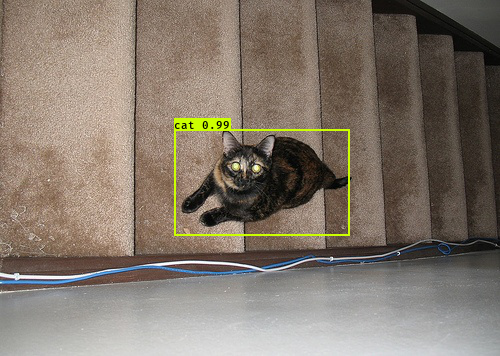

Input image filename:/tmp/VOCdevkit/VOC2007/JPEGImages/001552.jpg
(416, 416, 3)
Found 2 boxes for img
car 0.82 (7, 53) (130, 263)
car 1.00 (16, 25) (479, 375)
0.1590084540002863


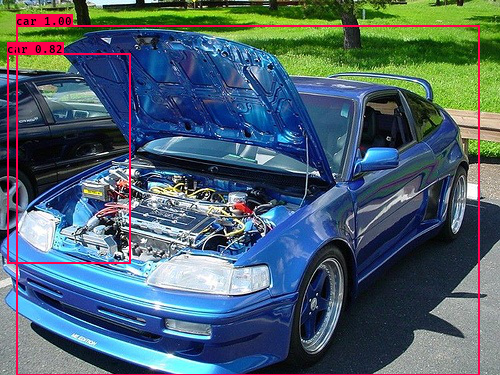

Input image filename:/tmp/VOCdevkit/VOC2007/JPEGImages/006054.jpg
(416, 416, 3)
Found 2 boxes for img
bird 0.66 (75, 270) (186, 326)
bird 0.75 (130, 79) (295, 234)
0.1642872369993711


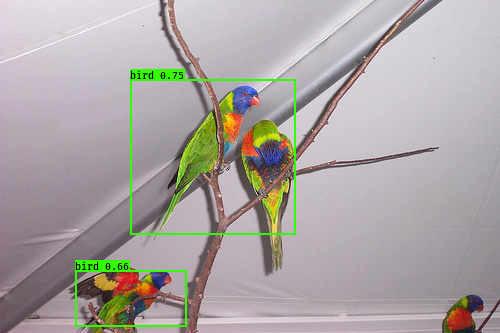

Input image filename:/tmp/VOCdevkit/VOC2007/JPEGImages/007404.jpg
(416, 416, 3)
Found 2 boxes for img
person 0.88 (79, 51) (493, 375)
person 1.00 (125, 96) (381, 336)
0.1469235229997139


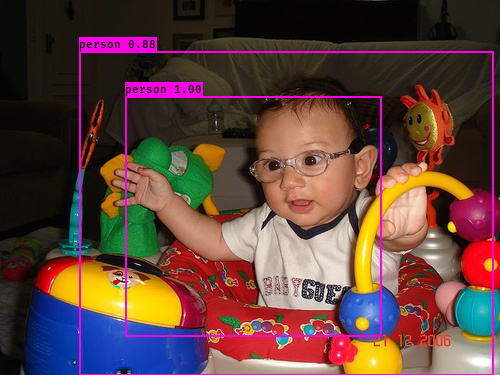

Input image filename:/tmp/VOCdevkit/VOC2007/JPEGImages/009067.jpg
(416, 416, 3)
Found 2 boxes for img
person 0.87 (179, 86) (308, 238)
horse 1.00 (82, 109) (456, 405)
0.13210482099930232


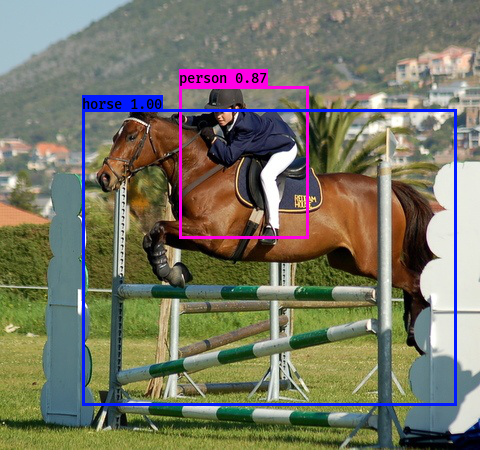

Input image filename:end


In [0]:
%cd "/content/gdrive/My Drive/04_영상인식_copied/CH678/keras-yolo3"
import sys
import argparse
import easydict

# 이미지 보여주기 위한 라이브러리
from IPython.display import display 

# yolo와 PIL 모듈 저장된 경로 sys 경로에 추가
sys.path.append('/content/CH678/keras-yolo3')

from yolo import YOLO, detect_video
from PIL import Image

# 이미지의 물체 탐색을 위한 함수
def detect_img(yolo):
    while True:
        img = input('Input image filename:')
        
        if img =='end':
            break
            
        else:
            try:
                image = Image.open(img)
            except:
                print('Open Error! Try again!')
                continue
            else:
                r_image = yolo.detect_image(image)
                #r_image.show()
                display(r_image)
    
       # yolo.close_session()

FLAGS = None

# 속성 형식으로 명령어 전달 : 모델 위치, anchors 위치, class 위치등 
args=easydict.EasyDict( {
            'model_path': '/content/gdrive/My Drive/04_영상인식_copied/CH678/keras-yolo3/model_data/trained_36_unfreeze.h5'
#            'model':    YOLO.get_defaults("model_path")
           ,'anchors': YOLO.get_defaults("anchors_path")
           ,'classes_path': '/content/gdrive/My Drive/04_영상인식_copied/CH678/keras-yolo3/model_data/voc_classes.txt'
#           ,'classes': YOLO.get_defaults("classes_path")
#           ,'gpu_num': str(YOLO.get_defaults("gpu_num"))
           ,'image' : 'a'
        })

FLAGS = args
print("Image detection mode")
detect_img(YOLO(**vars(FLAGS)))